# Ross Sea synthetic model

import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

# local python scripts
from RIS_gravity_inversion import plotting, optimization, synthetic
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils

from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import numpy as np
import pandas as pd
import xarray as xr
import verde as vd
import scipy as sp
import rioxarray
import pygmt
import copy
import harmonica as hm
import geopandas as gpd
from shapely.geometry import Polygon

# for plotting
import pvxarray
import matplotlib.pyplot as plt
import holoviews as hv
import hvplot.xarray
import hvplot.pandas
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# hvplot.extension('bokeh', 'matplotlib', 'plotly')
import panel.widgets as pnw
import panel as pn

pn.extension(comms="vscode")

import os

# Synthetic layers

This notebook creates a simple synthetic earth model comprised of 3 topography layers, Layer1, Layer2 and Layer3, representing the ice surface, icebase, and a crustal density contrast, respectively. We will compute the forward gravity of these 3 density contrasts. We will then create a low resolution version of Layer 2, to representing having limited knowledge of the ice-bed interface. We will then attempt to recover the full resolution Layer 2 in a gravity inversion (see `synthetic_inversion_simple_with_regional.ipynb`). The forward gravity of the full resolution layers will be used in the inversion, representing a perfect gravity survey, but the inversion will need to seperate out the regional field created by Layer3.

The layers are created with a series of 2D gaussian function of various wavelengths and amplitudes. 

## Set region and parameters

In [43]:
# polygon = regions.draw_region()

In [46]:
# inversion_region = utils.polygon_to_region(polygon)
# inversion_region

In [53]:
# set grid parameters
layer_spacing = 5e3
registration = "g"
reference = "ellipsoid"

# set gravity observation parameters
grav_observation_height = 1e3
sampled_grav_spacing = 20e3
airborne_grav_spacing = 1e3

In [68]:
# inversion_region = utils.alter_region(regions.ross_sea, zoom=200e3,)[0]
inversion_region = [-40e3, 280e3, -1800e3, -1380e3]

buffer_region = utils.alter_region(
    inversion_region,
    buffer=40e3,
)[1]

print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

inversion region =  [-40000.0, 280000.0, -1800000.0, -1380000.0]
buffer region =  [-80000, 320000, -1840000, -1340000]


returning original grid


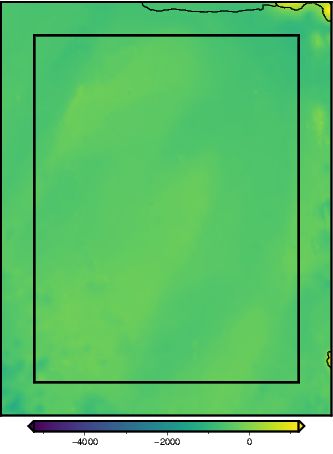

In [69]:
maps.plot_grd(
    fetch.bedmap2(layer='bed'), 
    region=buffer_region,
    show_region=inversion_region,
    coast=True,
    robust=True,
)

In [70]:
x_cells = int(abs(buffer_region[0] - buffer_region[1]) / layer_spacing)
y_cells = int(abs(buffer_region[2] - buffer_region[3]) / layer_spacing)
prisms_per_layer = x_cells * y_cells
print(f"x axis prisms: {x_cells}")
print(f"y axis prisms: {y_cells}")
print(f"prisms per layer: {prisms_per_layer}")

x axis prisms: 80
y axis prisms: 100
prisms per layer: 8000


In [71]:
x_cells = int(abs(inversion_region[0] - inversion_region[1]) / layer_spacing)
y_cells = int(abs(inversion_region[2] - inversion_region[3]) / layer_spacing)
prisms_per_layer = x_cells * y_cells
print(f"x axis prisms: {x_cells}")
print(f"y axis prisms: {y_cells}")
print(f"buffer region x range: {abs(inversion_region[0]-inversion_region[1])/1000}km")
print(f"buffer region y range: {abs(inversion_region[2]-inversion_region[3])/1000}km")
print(f"prisms per layer: {prisms_per_layer}")

x axis prisms: 64
y axis prisms: 84
buffer region x range: 320.0km
buffer region y range: 420.0km
prisms per layer: 5376


## Bathymetry

converting to be referenced to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


grid info (5000.0, [-80000.0, 320000.0, -1840000.0, -1340000.0], -1277.04309082, 1291.859375, 'g')
grid median value: -552.78033


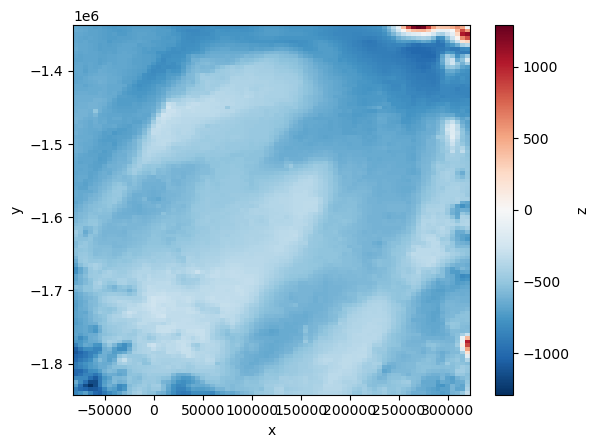

In [72]:
bed = fetch.bedmap2(
    layer="bed",
    reference=reference,
    region=buffer_region,
    spacing=layer_spacing,
    registration=registration,
)

bed.plot()
print("grid info", utils.get_grid_info(bed))
print("grid median value:", np.median(bed.values))

## Basement

returning grid with new region and/or registration, same spacing
grid info (5000.0, [-80000.0, 320000.0, -1840000.0, -1340000.0], -7388.00976562, -841.826843262, 'g')
grid median value: -2596.1643


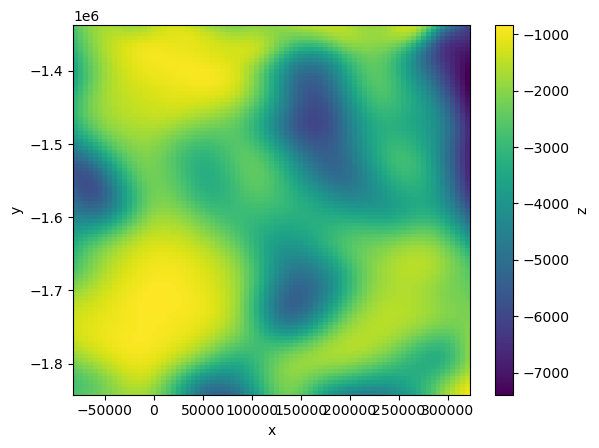

In [73]:
basement = fetch.basement(
    region=buffer_region,
    spacing=layer_spacing,
    registration=registration,
)
basement.plot()

print("grid info", utils.get_grid_info(basement))
print("grid median value:", np.median(basement.values))

## save to .zarr files

In [74]:
# use conventional coordinate names
bed = bed.rename({"x": "easting", "y": "northing"})
basement = basement.rename({"x": "easting", "y": "northing"})

In [75]:
output = bed.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/Ross_Sea_bed.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

output = basement.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/Ross_Sea_basement.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

## load .zarr files

In [76]:
bed = xr.open_zarr("../synthetic_data/Ross_Sea_bed.zarr").z
basement = xr.open_zarr("../synthetic_data/Ross_Sea_basement.zarr").z

## vizualize

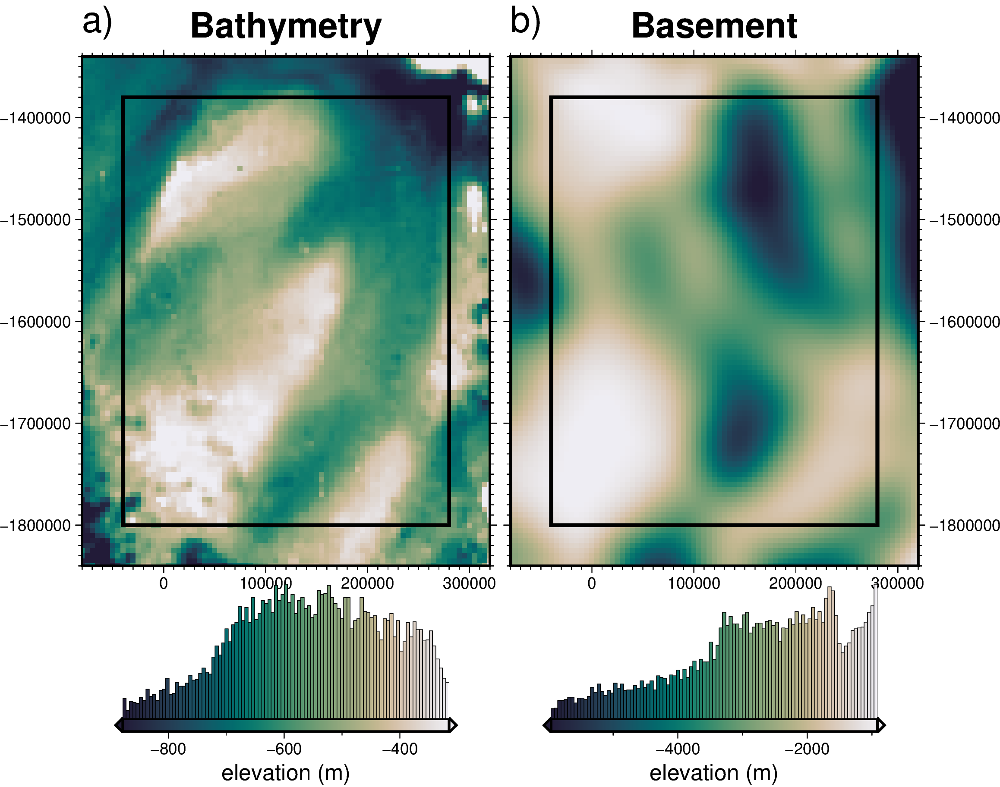

In [82]:
fig = maps.plot_grd(
    bed,
    show_region=inversion_region,
    fig_height=10,
    title="Bathymetry",
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    cmap="rain",
    reverse_cpt=True,
    cbar_label="elevation (m)",
    frame=["nSWe", "xaf10000", "yaf10000"],
    robust=True,
)

fig.text(
    position="TL",
    text="a)",
    fill="white",
    font="20p,Helvetica,black",
    offset="j0/-1",
    clearance="+tO",
    no_clip=True,
)

fig = maps.plot_grd(
    basement,
    show_region=inversion_region,
    fig_height=10,
    title="Basement",
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    cmap="rain",
    reverse_cpt=True,
    cbar_label="elevation (m)",
    frame=["nSwE", "xaf10000", "yaf10000"],
    fig=fig,
    origin_shift="xshift",
    robust=True,
)

fig.text(
    position="TL",
    text="b)",
    fill="white",
    font="20p,Helvetica,black",
    offset="j0/-1",
    clearance="+tO",
    no_clip=True,
)

fig.show()

# Observed gravity
Here we use the above three layers to create a synthethic gravity survey.

In [79]:
# make pandas dataframe of locations to calculate gravity

# create lists of coordinates
coords = vd.grid_coordinates(
    region=inversion_region,
    spacing=layer_spacing,
    pixel_register=False,
    extra_coords=grav_observation_height,
)

# grid the coordinates
observations = vd.make_xarray_grid(
    (coords[0], coords[1]),
    data=coords[2],
    data_names="upward",
    dims=("northing", "easting"),
).upward

# observations = fetch.resample_grid(observations, region=inversion_region, registration=registration)
print(utils.get_grid_info(observations))

observation_points = vd.grid_to_table(observations)
observation_points

(5000.0, [-40000.0, 280000.0, -1800000.0, -1380000.0], 1000.0, 1000.0, 'g')


,northing,easting,upward
0,-1800000.0,-40000.0,1000.0
1,-1800000.0,-35000.0,1000.0
2,-1800000.0,-30000.0,1000.0
3,-1800000.0,-25000.0,1000.0
4,-1800000.0,-20000.0,1000.0
...,...,...,...
5520,-1380000.0,260000.0,1000.0
5521,-1380000.0,265000.0,1000.0
5522,-1380000.0,270000.0,1000.0
5523,-1380000.0,275000.0,1000.0


In [221]:
# Bed
density_contrast = 2300 - 1030
grid = bed

zref = grid.values.mean()
density = xr.where(grid >= zref, density_contrast, -density_contrast)

bed_prisms = inv_utils.grids_to_prisms(
    grid,
    zref,
    density=density,
)

# Basement
density_contrast = 2500 - 2300
grid = basement

zref = grid.values.mean()
density = xr.where(grid >= zref, density_contrast, -density_contrast)

basement_prisms = inv_utils.grids_to_prisms(
    grid,
    zref,
    density=density,
)

# plotting.show_prism_layers(
#     [
#         surface_prisms,
#         bed_prisms,
#         basement_prisms,
#         ],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     # color_by='constant',
#     log_scale=False,
#     clip_box=False,
#     zscale=20,
# )

  0%|                                                  | 0/5525 [00:00<?, ?it/s]

  0%|                                                  | 0/5525 [00:00<?, ?it/s]

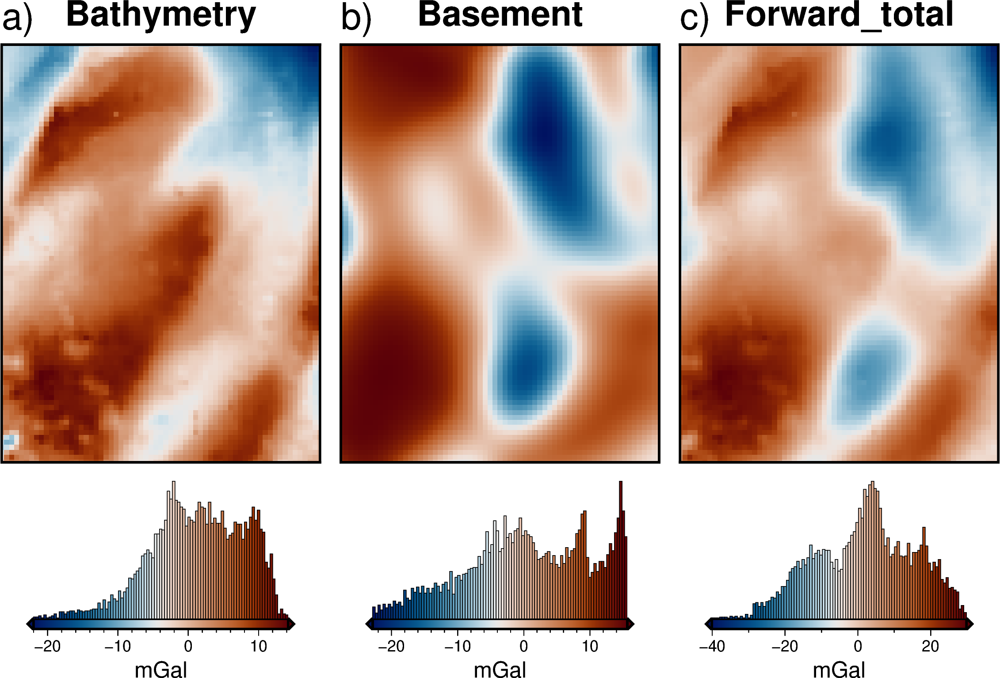

In [222]:
forward_grids, forward_df = inv_utils.forward_grav_of_prismlayer(
    [
        bed_prisms,
        basement_prisms,
    ],
    observation_points,
    plot=True,
    names=[
        "bathymetry",
        "basement",
    ],
    remove_mean=False,
    progressbar=True,
)

In [223]:
# save to a .zarr file
forward_grids.to_zarr(
    "../synthetic_data/Ross_Sea_forward_grav.zarr",
    mode="w",
)

In [224]:
# load zarr file
forward_grids = xr.open_zarr("../synthetic_data/Ross_Sea_forward_grav.zarr")
forward_grids

<xarray.Dataset>
Dimensions:        (northing: 85, easting: 65)
Coordinates:
  * easting        (easting) float64 -4e+04 -3.5e+04 -3e+04 ... 2.75e+05 2.8e+05
  * northing       (northing) float64 -1.8e+06 -1.795e+06 ... -1.38e+06
Data variables:
    basement       (northing, easting) float64 dask.array<chunksize=(85, 65), meta=np.ndarray>
    bathymetry     (northing, easting) float64 dask.array<chunksize=(85, 65), meta=np.ndarray>
    forward_total  (northing, easting) float64 dask.array<chunksize=(85, 65), meta=np.ndarray>
    upward         (northing, easting) float64 dask.array<chunksize=(85, 65), meta=np.ndarray>

In [225]:
forward_df = vd.grid_to_table(forward_grids)
forward_df

,northing,easting,basement,bathymetry,forward_total,upward
0,-1800000.0,-40000.0,11.347847,-1.169473,10.178373,1000.0
1,-1800000.0,-35000.0,12.022782,3.592784,15.615567,1000.0
2,-1800000.0,-30000.0,12.592603,5.341447,17.934051,1000.0
3,-1800000.0,-25000.0,13.024391,4.314322,17.338714,1000.0
4,-1800000.0,-20000.0,13.288657,3.793990,17.082646,1000.0
...,...,...,...,...,...,...
5520,-1380000.0,260000.0,-7.248773,-20.194754,-27.443527,1000.0
5521,-1380000.0,265000.0,-9.924521,-21.042237,-30.966758,1000.0
5522,-1380000.0,270000.0,-12.719607,-21.589889,-34.309496,1000.0
5523,-1380000.0,275000.0,-15.504155,-22.009418,-37.513572,1000.0


#### Save to csv

In [226]:
forward_df.to_csv(
    "../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [227]:
forward_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

## Sample at constant spacing
make observation points in a lower-resolution grid

In [88]:
# # regular grid
# coords = vd.grid_coordinates(
#     region=inversion_region,
#     spacing=sampled_grav_spacing,
#     pixel_register=False,
#     extra_coords=grav_observation_height,
# )

# # turn coordinates into dataarray
# points = vd.make_xarray_grid(
#     (coords[0], coords[1]),
#     data=coords[2],
#     data_names="upward",
#     dims=("northing", "easting"),
# )

# # turn dataarray into dataframe
# df = vd.grid_to_table(points)
# df

### sample grid

In [89]:
# # sample the data at the observation points
# grav_sampled = profile.sample_grids(
#     df, 
#     forward_grids.forward_total, 
#     "Gobs", 
#     coord_names=("easting", "northing")
# )
# grav_sampled

In [90]:
# Gobs_sampled = grav_sampled.set_index(["northing", "easting"]).to_xarray().Gobs
# # Gobs_sampled.plot()

In [91]:
# # plot the synthetic gravity anomaly grid
# fig = maps.plot_grd(
#     forward_grids.forward_total,
#     region=inversion_region,
#     fig_height=10,
#     cmap="vik",
#     title="Synthetic gravity",
#     cbar_label="mGal",
#     frame=["nSWe", "xaf10000", "yaf10000"],
#     # show_region=inversion_region,
#     hist=True,
#     cbar_yoffset=3,
#     grd2_cpt=True,
# )
# fig.text(
#     position="TL",
#     text="a)",
#     fill="white",
#     font="20p,Helvetica,black",
#     offset="j0/-1",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot observation points
# # fig.plot(grav[["x", "y"]], style="c.04c", color="black")

# # plot the synthetic observed gravity grid
# fig = maps.plot_grd(
#     Gobs_sampled,
#     region=inversion_region,
#     fig_height=10,
#     cmap="vik",
#     title="Sampled gravity",
#     cbar_label="mGal",
#     frame=["nSwE", "xaf10000", "yaf10000"],
#     # show_region=inversion_region,
#     hist=True,
#     cbar_yoffset=3,
#     grd2_cpt=True,
#     fig=fig,
#     origin_shift="xshift",
# )
# fig.text(
#     position="TL",
#     text="b)",
#     fill="white",
#     font="20p,Helvetica,black",
#     offset="j0/-1",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.show()

### save to a csv

In [92]:
# grav_sampled.to_csv(
#     "../synthetic_data/Ross_Sea_sampled_gravity.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

## Simulate airborne survey

### create observation points

In [228]:
# irregular grid
# offset so doesn't line up with anomalies
offset = 7e3
# simulate N-S tie lines
x = np.arange(inversion_region[0] + offset, inversion_region[1], 50e3)
y = np.arange(inversion_region[2], inversion_region[3], airborne_grav_spacing)
# remove the 3rd and 9th N-S lines
x = np.delete(x, 2)
# x = np.delete(x, 8)

coords = np.meshgrid(x, y)
# turn coordinates into dataarray
ties = vd.make_xarray_grid(
    coords,
    data=np.ones_like(coords[0]) * 1e3,
    data_names="upward",
    dims=("northing", "easting"),
)
# turn dataarray into dataframe
df_ties = vd.grid_to_table(ties)

# simulate E-W flight lines
x = np.arange(inversion_region[0], inversion_region[1], airborne_grav_spacing)
y = np.arange(inversion_region[2] + offset, inversion_region[3], 15e3)
# remove a few E-W lines, starting from bottom
y = np.delete(y, [3, 8, 17])

coords = np.meshgrid(x, y)
# turn coordinates into dataarray
lines = vd.make_xarray_grid(
    coords,
    data=np.ones_like(coords[0]) * 1e3,
    data_names="upward",
    dims=("northing", "easting"),
)
# turn dataarray into dataframe
df_lines = vd.grid_to_table(lines)

# merge dataframes
df = pd.concat([df_ties, df_lines])
df

,northing,easting,upward
0,-1800000.0,-33000.0,1000.0
1,-1800000.0,17000.0,1000.0
2,-1800000.0,117000.0,1000.0
3,-1800000.0,167000.0,1000.0
4,-1800000.0,217000.0,1000.0
...,...,...,...
7995,-1388000.0,275000.0,1000.0
7996,-1388000.0,276000.0,1000.0
7997,-1388000.0,277000.0,1000.0
7998,-1388000.0,278000.0,1000.0


### sample grid

In [229]:
# sample the data at the observation points
grav_survey = profile.sample_grids(
    df, forward_grids.forward_total, "Gobs", coord_names=("easting", "northing")
)
grav_survey.describe()

,northing,easting,upward,Gobs
count,1.052000e+04,10520.000000,10520.0,10520.000000
mean,-1.584797e+06,120897.338403,1000.0,1.322698
std,1.222657e+05,95783.433436,0.0,13.417931
min,-1.800000e+06,-40000.000000,1000.0,-38.207956
25%,-1.688000e+06,31000.000000,1000.0,-8.664270
50%,-1.583000e+06,119500.000000,1000.0,2.394837
75%,-1.478000e+06,208000.000000,1000.0,11.102210
max,-1.381000e+06,279000.000000,1000.0,29.755492


## grid with equivalent sources

In [230]:
# dampings = np.logspace(-40, 20, num=1)
# depths = np.linspace(2e3, 100e3, 10)
dampings=[1]
depths=[10e3]
print(dampings)
print(depths)
import itertools

parameter_sets = [
    dict(damping=combo[0], depth=combo[1])
    for combo in itertools.product(dampings, depths)
]
print("Number of combinations:", len(parameter_sets))

eqs_best, Gobs_survey, grav_survey_eqs = inv_utils.eq_sources_best(
    parameter_sets=parameter_sets,
    coordinates=(grav_survey.easting, grav_survey.northing, grav_survey.upward),
    data=grav_survey.Gobs,
    region=inversion_region,
    spacing=layer_spacing,
    block_size=layer_spacing,
)
# Gobs_survey.plot()

[1]
[10000.0]
Number of combinations: 1


Parameters:   0%|          | 0/1 [00:00<?, ?it/s]

Best score: 0.9999180631251849
Best parameters: {'damping': 1, 'depth': 10000.0}


In [231]:
# Gobs_survey = pygmt.surface(
#     data=grav_survey[["easting", "northing", "Gobs"]],
#     region=inversion_region,
#     spacing=airborne_grav_spacing,
#     registration=registration,
#     T=0.25,
#     verbose="q",
# )
# Gobs_survey.plot()

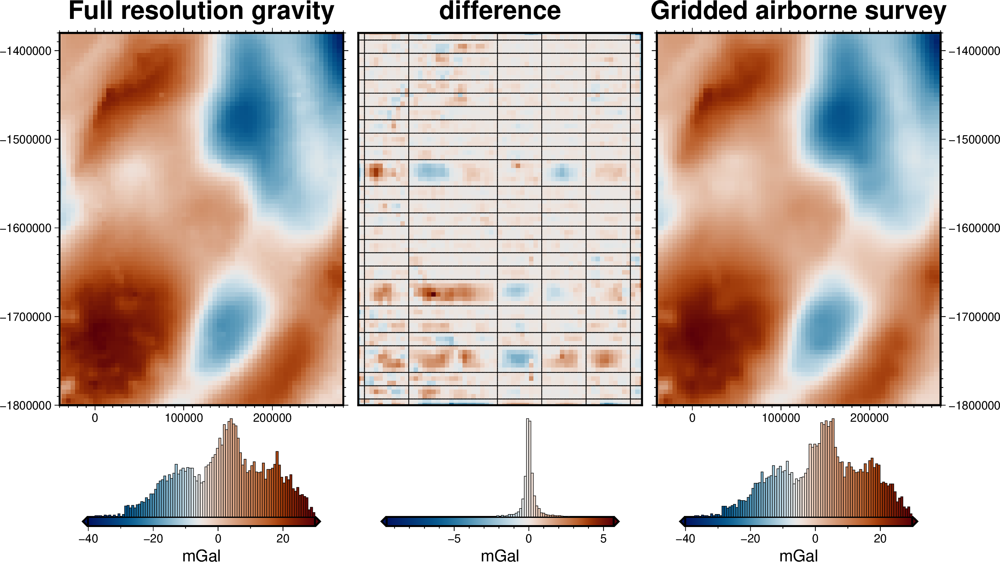

In [232]:
# plot the synthetic gravity anomaly grid
lims = utils.get_min_max(forward_grids.forward_total)
fig = maps.plot_grd(
    forward_grids.forward_total,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Full resolution gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=3,
)

dif = forward_grids.forward_total - Gobs_survey#.rename({"x":"easting", "y":"northing"})
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="vik+h0",
    title="difference",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
)

# plot observation points
fig.plot(grav_survey[["easting", "northing"]], style="c.02c", color="black")

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    Gobs_survey,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Gridded airborne survey",
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=3,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

## Add noise

In [233]:
df = vd.grid_to_table(Gobs_survey)
df["Gobs_noise"] = synthetic.contaminate(
    df.predicted_grav,
    stddev=0.01,
    percent=True,
    seed=0,
)

Gobs_survey_noise = df.set_index(["northing", "easting"]).to_xarray().Gobs_noise

Standard deviation used for noise: [0.37211266983194563]


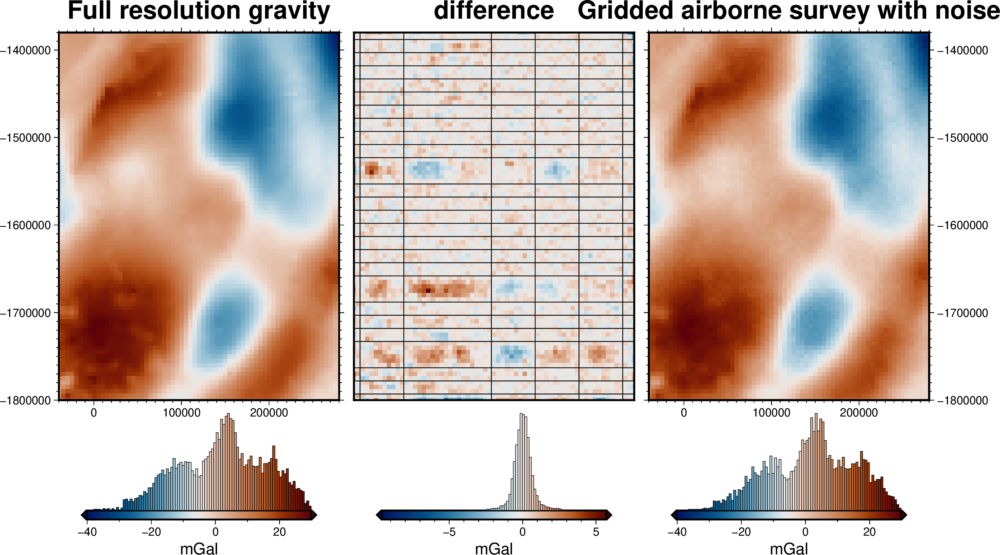

In [234]:
# plot the synthetic gravity anomaly grid
lims = utils.get_min_max(forward_grids.forward_total)
fig = maps.plot_grd(
    forward_grids.forward_total,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Full resolution gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=3,
)

dif = forward_grids.forward_total - Gobs_survey_noise#.rename({"x":"easting", "y":"northing"})
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="vik+h0",
    title="difference",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
)

# plot observation points
fig.plot(grav_survey[["easting", "northing"]], style="c.02c", color="black")

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    Gobs_survey_noise,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Gridded airborne survey with noise",
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=3,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

### save to a csv

In [235]:
df["upward"]=grav_observation_height
df.to_csv(
    "../synthetic_data/Ross_Sea_airborne_survey_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [236]:
grav_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_airborne_survey_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,predicted_grav,Gobs_noise,upward
0,-1800000.0,-40000.0,11.598446,12.260800,1000.0
1,-1800000.0,-35000.0,16.064631,16.219463,1000.0
2,-1800000.0,-30000.0,18.862281,19.232410,1000.0
3,-1800000.0,-25000.0,18.091392,18.931185,1000.0
4,-1800000.0,-20000.0,16.644949,17.345819,1000.0
...,...,...,...,...,...
5520,-1380000.0,260000.0,-26.405825,-26.891765,1000.0
5521,-1380000.0,265000.0,-29.991817,-29.925102,1000.0
5522,-1380000.0,270000.0,-31.949737,-32.176367,1000.0
5523,-1380000.0,275000.0,-32.128447,-32.398519,1000.0


# Create low-resolution bathymetry
## random constraint points

First, we will create a shapefile which represents the border of an ice shelf (groundingline / calving front)

In [104]:
# polygon = regions.draw_region(points=utils.region_to_df(inversion_region))

In [116]:
# create mask grid
# mask = utils.mask_from_polygon(polygon, region=inversion_region, spacing=layer_spacing).rename({"x":"easting","y":"northing"})
# mask.to_netcdf("../data/Ross_Sea_polygon.nc")
# # mask.plot()

In [156]:
# # create shapefile from mask to use later
# points = utils.shapes_to_df(polygon)
# gdf = gpd.GeoDataFrame(
#     index=[0], 
#     geometry=[Polygon(zip(points.x, points.y))],
# )
# gdf.to_file("../data/Ross_Sea_outline.shp")

In [183]:
df = utils.region_to_df(inversion_region)
gdf = gpd.GeoDataFrame(
    index=[0], 
    geometry=[Polygon(zip(df.x, df.y))],
)
gdf.geometry.envelope.buffer(-100e3).buffer(90e3).to_file("../data/Ross_Sea_outline.shp")
# gpd.read_file("../data/Ross_Sea_outline.shp").plot()

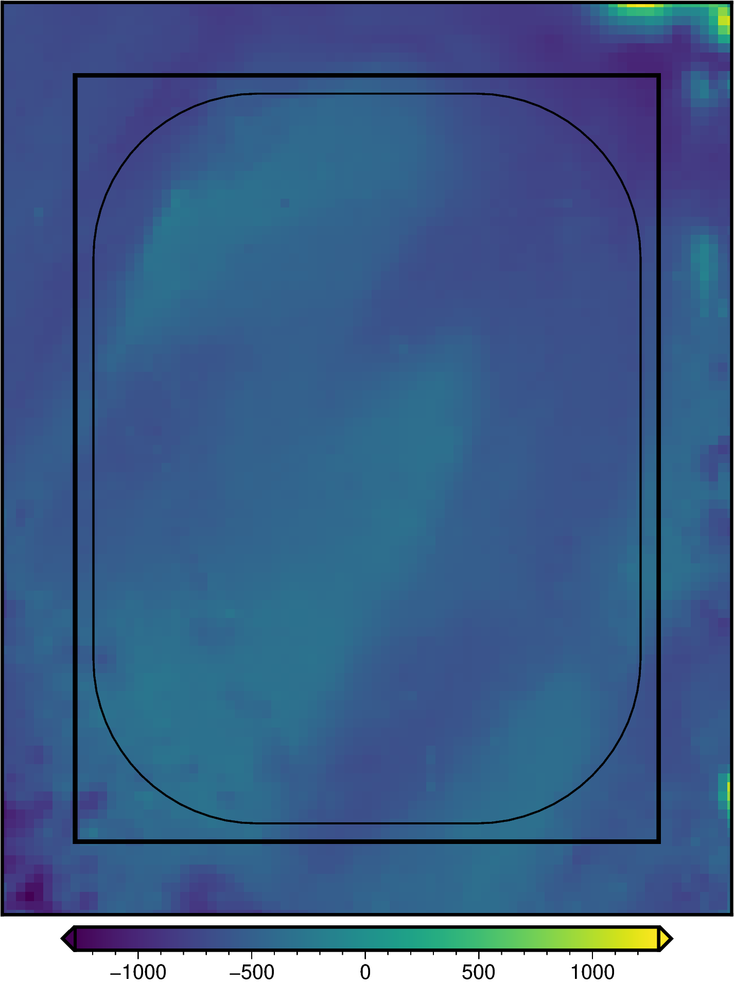

In [184]:
fig = maps.plot_grd(
    bed,
    region = buffer_region,
    show_region = inversion_region,
    cbar_labels = "bed elevation",
    cbar_units = "m",
)

fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)

fig.show()

In [186]:
x_range = abs(inversion_region[0] - inversion_region[1]) / 1000
y_range = abs(inversion_region[2] - inversion_region[3]) / 1000
inversion_area = x_range * y_range
print(f"inversion region: {round(inversion_area)} km\u00b2")

gdf = gpd.read_file("../data/Ross_Sea_outline.shp")
ice_shelf_area = gdf.geometry.area.item() / 10**6
print(f"ice shelf area: {round(ice_shelf_area)} km\u00b2")

# compared to Ross Ice Shelf
print(f"Ross Ice Shelf constraint density: 1 constraint per {487000 / 224} km\u00b2")

inversion region: 134400 km²
ice shelf area: 113006 km²
Ross Ice Shelf constraint density: 1 constraint per 2174.1071428571427 km²


In [238]:
# num_constraints = 30
# const_density = inversion_area / num_constraints

const_density = 2500
num_constraints = int(ice_shelf_area / const_density)
print(f"number of constraints: {num_constraints}")
print(f"constraint density: 1 constraint per {const_density} km\u00b2")

number of constraints: 45
constraint density: 1 constraint per 2500 km²


In [239]:
# mask bed inside of ice shelf
bed_masked = utils.mask_from_shp(
    shapefile="../data/Ross_Sea_outline.shp",
    xr_grid=bed,
    masked=True,
    # invert=False,
).rename("upward")

# dataframe of bed values
outside_constraints = vd.grid_to_table(bed_masked).dropna().drop(columns="upward")

# create random constraints
coords = vd.scatter_points(
    region=inversion_region, size=num_constraints*2, random_state=0
)
constraints = pd.DataFrame(data={"easting": coords[0], "northing": coords[1]})

# check whether points are inside or side of shp
gdf = gpd.GeoDataFrame(
    constraints,
    geometry=gpd.points_from_xy(x=constraints.easting, y=constraints.northing),
    crs = "EPSG:3031")
constraints["inside"] = gdf.within(gpd.read_file("../data/Ross_Sea_outline.shp").geometry[0])
constraints.drop(columns="geometry", inplace=True)

# keep only set number of constraints
inside_constraints = constraints[constraints.inside].sample(n=num_constraints, random_state=0)

# merge with outside constraints
outside_constraints["inside"]=False

constraints = pd.concat([outside_constraints, inside_constraints])
constraints[constraints.inside].describe()

,northing,easting
count,4.500000e+01,45.000000
mean,-1.589286e+06,103960.326564
std,1.067710e+05,81583.647120
min,-1.747996e+06,-20727.849079
25%,-1.678167e+06,11619.045723
50%,-1.560978e+06,109219.447314
75%,-1.504367e+06,164774.726825
max,-1.423450e+06,261999.385125


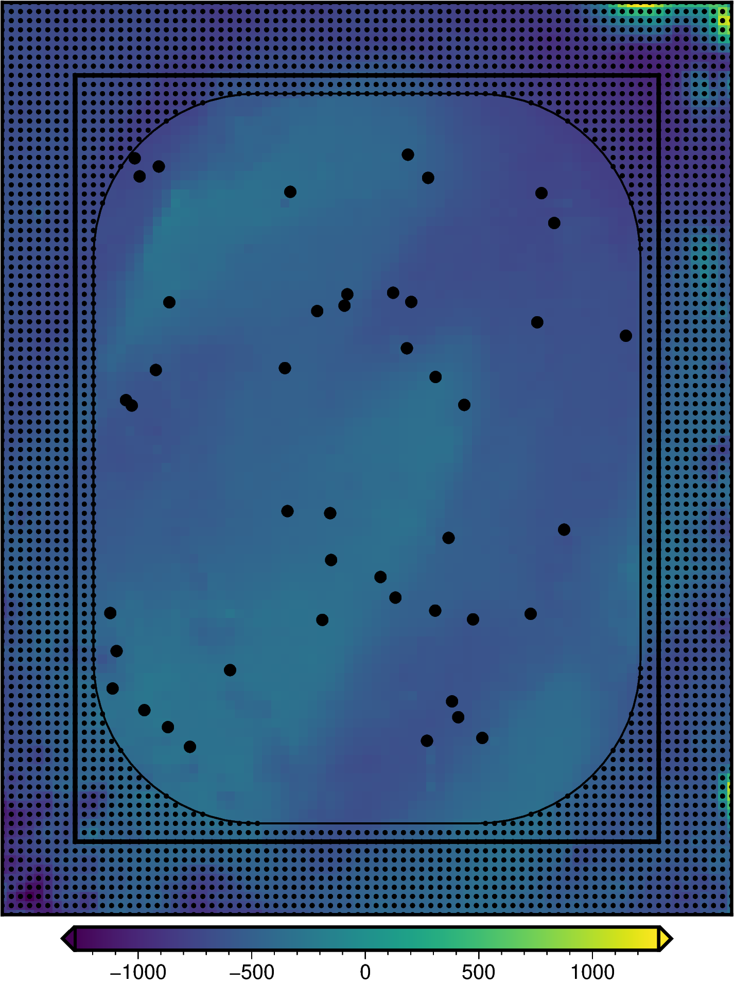

In [240]:
fig = maps.plot_grd(
    bed,
    region = buffer_region,
    show_region = inversion_region,
    cbar_labels = "bed elevation",
    cbar_units = "m",
)

fig.plot(
    x=constraints[constraints.inside].easting,
    y=constraints[constraints.inside].northing,
    style="c.2c",
    fill="black",
)

fig.plot(
    region = buffer_region,
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.08c",
    fill="black",
)

fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)

fig.show()

In [241]:
constraints = profile.sample_grids(
    constraints, bed, "upward", coord_names=("easting", "northing")
)

# grid with verde
grd=vd.Spline()#mindist=1e-5, damping=1e-20)
coords = (constraints.easting, constraints.northing)
grd.fit(coords, constraints.upward)
lowres_bed = grd.grid(
    region=buffer_region,
    spacing=layer_spacing,
).scalars
print(np.mean(vd.cross_val_score(grd, coords, constraints.upward)))
print(grd.score(coords, constraints.upward))

# lowres_bed2 = pygmt.surface(
#     data=constraints[['easting', 'northing', 'upward']],
#     region=buffer_region,
#     spacing=layer_spacing,
#     registration=registration,
#     T=0.35,
#     verbose="q",
# )#.rename({"x": "easting", "y": "northing"})

# lowres_bed.plot()

0.9850990041530965
0.9999999999999999


In [242]:
# resample to check values are same at constraints
check = profile.sample_grids(
    constraints, lowres_bed, "lowres", coord_names=("easting", "northing")
)
check['dif']=check.upward - check.lowres
check.describe()

,northing,easting,upward,lowres,dif
count,3.716000e+03,3716.000000,3716.000000,3716.000000,3716.000000
mean,-1.588700e+06,117973.147119,-604.953373,-604.953455,0.000081
std,1.795388e+05,147668.849091,194.600312,194.599200,0.051601
min,-1.840000e+06,-80000.000000,-1277.043091,-1277.043091,-1.271239
25%,-1.780000e+06,-35000.000000,-712.485733,-712.485733,0.000000
50%,-1.585000e+06,115000.000000,-617.631328,-617.673005,0.000000
75%,-1.395000e+06,275000.000000,-503.321327,-503.321327,0.000000
max,-1.340000e+06,320000.000000,1291.859375,1291.859375,1.079166


In [243]:
output = lowres_bed.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/Ross_Sea_lowres_bed.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

In [244]:
lowres_bed = xr.open_zarr("../synthetic_data/Ross_Sea_lowres_bed.zarr").z
utils.get_grid_info(lowres_bed)

(5000.0,
 [-80000.0, 320000.0, -1840000.0, -1340000.0],
 -1277.04309082,
 1291.859375,
 'g')

In [245]:
constraints.to_csv(
    "../synthetic_data/Ross_Sea_synthetic_constraints.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [246]:
constraints = pd.read_csv(
    "../synthetic_data/Ross_Sea_synthetic_constraints.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

returning grid with new region and/or registration, same spacing
returning grid with new region and/or registration, same spacing


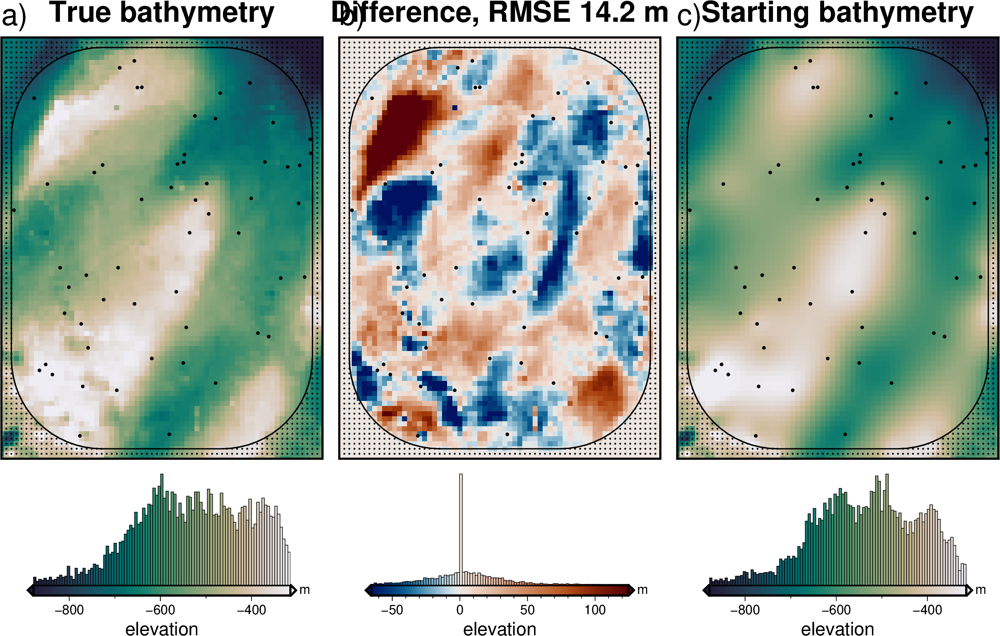

In [197]:
# compare starting and actual bed
bed_inner = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
lowres_bed_inner = lowres_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

dif = bed_inner - lowres_bed_inner

rms = utils.RMSE(dif)
robust=True
lims_a = utils.get_min_max(bed, robust=robust)
lims_b = utils.get_min_max(lowres_bed, robust=robust)
lims = (min((lims_a[0], lims_b[0])), max(lims_a[1], lims_b[1]))

fig = maps.plot_grd(
    bed,
    # fig_height=10,
    region = inversion_region,
    cbar_label = "elevation",
    cbar_unit = "m",
    title = "True bathymetry",
    cmap="rain",
    cpt_lims=lims,
    reverse_cpt=True,
    points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
    points_style="c.08c",
    inset=False,
    hist=True,
    # robust=True,
)
fig.plot(
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.04c",
    fill="black",
)
fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="20p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    dif,
    region = inversion_region,
    cbar_label = "elevation",
    cbar_unit = "m",
    title = f"Difference, RMSE {round(rms,2)} m",
    cmap="vik+h0",
    points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
    points_style="c.08c",
    inset=False,
    hist=True,
    robust=True,
    fig=fig,
    origin_shift="xshift",
)
fig.plot(
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.04c",
    fill="black",
)
fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="20p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    lowres_bed,
    region = inversion_region,
    cbar_label = "elevation",
    cbar_unit = "m",
    title = "Starting bathymetry",
    cmap="rain",
    cpt_lims=lims,
    reverse_cpt=True,
    points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
    points_style="c.08c",
    inset=False,
    hist=True,
    # robust=True,
    fig=fig,
    origin_shift="xshift",
)
fig.plot(
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.04c",
    fill="black",
)
fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="20p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig.show()

In [332]:
# # compare starting and actual layer2 grids
# grids = utils.grd_compare(
#     bed,
#     lowres_bed,
#     plot=True,
#     plot_type="pygmt",
#     cmap="rain",
#     diff_cmap="vik+h0",
#     reverse_cpt=True,
#     grid1_name="True bathymetry",
#     grid2_name="Starting bathymetry",
#     title="Difference",
#     cbar_unit="m",
#     cbar_label="elevation",
#     RMSE_decimals=0,
#     points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
#     points_style="c.15c",
#     # show_region=inversion_region,
#     region=inversion_region,
#     inset=False,
#     hist=True,
#     # robust=True,
#     robust=False,
#     subplot_labels=True,
# )

## repeat with constraints following a semi-regular grid
divide the ice shelf region into blocks with 1 block per constraint.
Randomly sample point in each box to be the constraint

In [247]:
ice_shelf_region = vd.get_region((constraints[constraints.inside].easting, constraints[constraints.inside].northing))
x = ice_shelf_region[1] - ice_shelf_region[0]
y = ice_shelf_region[3] - ice_shelf_region[2]
num_y = int(np.ceil((num_constraints / (x/y))**.5))
num_x = int(np.ceil(num_constraints / num_y))
num_x, num_y

(6, 8)

In [248]:
# create regular grid, with set number of constriant points
reg = vd.pad_region(ice_shelf_region, -5e3)
# reg= ice_shelf_region
x = np.linspace(reg[0], reg[1], int(num_x*1.1))
y = np.linspace(reg[2], reg[3], int(num_y*1.1))
coords = np.meshgrid(x, y)

# turn coordinates into dataarray
da = vd.make_xarray_grid(
    coords,
    data=np.ones_like(coords[0]) * 1e3,
    data_names="upward",
    dims=("northing", "easting"),
)
# turn dataarray into dataframe
df = vd.grid_to_table(da)

In [249]:
# add randomness to the points
rand = np.random.default_rng(seed=0)
semi_regular_constraints = df.copy()
semi_regular_constraints["northing"] = rand.normal(df.northing, 4e3)
semi_regular_constraints["easting"] = rand.normal(df.easting, 4e3)

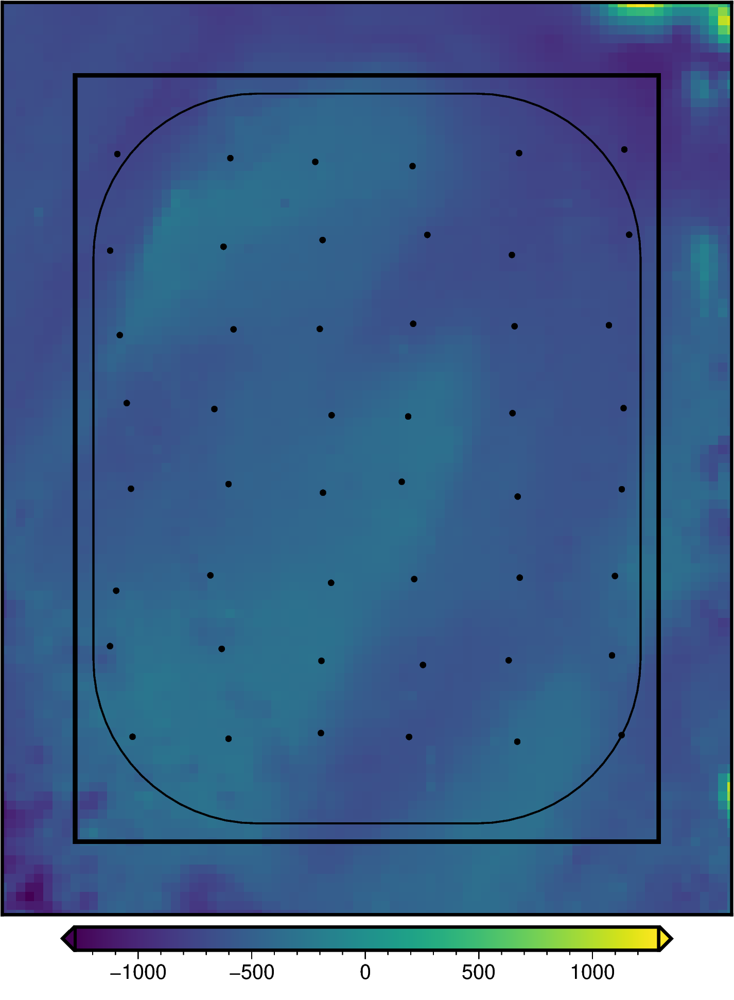

In [250]:
fig = maps.plot_grd(
    bed,
    region = buffer_region,
    show_region = inversion_region,
    cbar_labels = "bed elevation",
    cbar_units = "m",
)

fig.plot(
    x=semi_regular_constraints.easting,
    y=semi_regular_constraints.northing,
    style="c.1c",
    fill="black",
)

fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)

fig.show()

In [251]:
# get constraints outside of ice shelf
bed_masked = utils.mask_from_shp(
    shapefile="../data/Ross_Sea_outline.shp",
    xr_grid=bed,
    masked=True,
    # invert=False,
).rename("upward")
outside_constraints = vd.grid_to_table(bed_masked).dropna().drop(columns="upward")
outside_constraints["inside"]=False

# check whether points are inside or outside of shp
gdf = gpd.GeoDataFrame(
    semi_regular_constraints,
    geometry=gpd.points_from_xy(x=semi_regular_constraints.easting, y=semi_regular_constraints.northing),
    crs = "EPSG:3031")
semi_regular_constraints["inside"] = gdf.within(gpd.read_file("../data/Ross_Sea_outline.shp").geometry[0])
semi_regular_constraints.drop(columns="geometry", inplace=True)

# keep only set number of constraints
inside_constraints = semi_regular_constraints[semi_regular_constraints.inside].sample(n=num_constraints, random_state=0)

constraints = pd.concat([outside_constraints, inside_constraints]).drop(columns="upward")
constraints[constraints.inside].describe()

,northing,easting
count,4.500000e+01,45.000000
mean,-1.596178e+06,120735.064083
std,9.961971e+04,92053.339037
min,-1.745138e+06,-20881.294934
25%,-1.692845e+06,44078.012821
50%,-1.604020e+06,100651.090056
75%,-1.517462e+06,200943.684263
max,-1.422618e+06,263755.814934


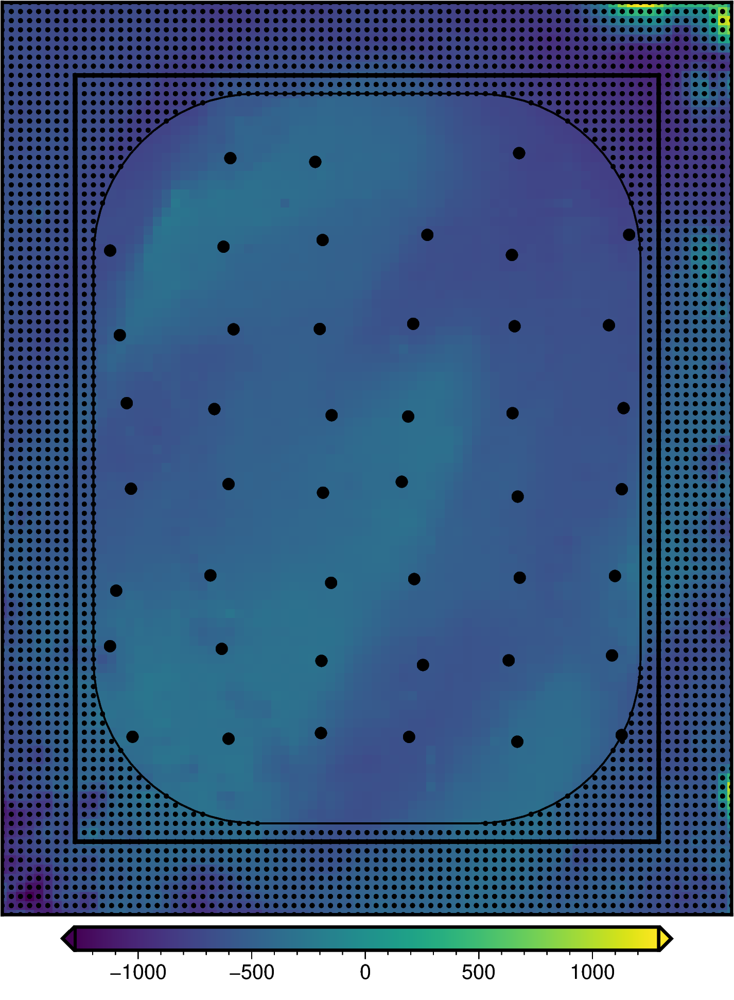

In [252]:
fig = maps.plot_grd(
    bed,
    region = buffer_region,
    show_region = inversion_region,
    cbar_labels = "bed elevation",
    cbar_units = "m",
)

fig.plot(
    x=constraints[constraints.inside].easting,
    y=constraints[constraints.inside].northing,
    style="c.2c",
    fill="black",
)

fig.plot(
    region = buffer_region,
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.08c",
    fill="black",
)

fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)

fig.show()

In [253]:
constraints = profile.sample_grids(
    constraints, bed, "upward", coord_names=("easting", "northing")
)

# grid with verde
grd=vd.Spline()#mindist=1e-5, damping=1e-20)
coords = (constraints.easting, constraints.northing)
grd.fit(coords, constraints.upward)

lowres_bed_semiregular = grd.grid(
    region=buffer_region,
    spacing=layer_spacing,
).scalars
print(np.mean(vd.cross_val_score(grd, coords, constraints.upward)))
print(grd.score(coords, constraints.upward))

# lowres_bed_semiregular.plot()

0.9845686478792037
1.0


In [254]:
# resample to check values are same at constraints
check = profile.sample_grids(
    constraints, lowres_bed_semiregular, "lowres", coord_names=("easting", "northing")
)
check['dif']=check.upward - check.lowres
check.describe()

,northing,easting,upward,lowres,dif
count,3.716000e+03,3716.000000,3716.000000,3716.000000,3716.000000
mean,-1.588783e+06,118176.285760,-605.016489,-605.016365,-0.000124
std,1.794919e+05,147733.858321,194.459605,194.459082,0.073780
min,-1.840000e+06,-80000.000000,-1277.043091,-1277.043091,-2.106990
25%,-1.780000e+06,-35000.000000,-712.485733,-712.485733,0.000000
50%,-1.587500e+06,115000.000000,-617.423767,-617.423767,0.000000
75%,-1.395000e+06,275000.000000,-503.114761,-503.114761,0.000000
max,-1.340000e+06,320000.000000,1291.859375,1291.859375,2.445473


In [255]:
rms = utils.RMSE(check.dif)
print(f"RMSE at constraints: {rms} mGal")

RMSE at constraints: 0.0 mGal


In [256]:
output = lowres_bed_semiregular.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/Ross_Sea_lowres_bed_semiregular.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

In [257]:
lowres_bed_semiregular = xr.open_zarr("../synthetic_data/Ross_Sea_lowres_bed_semiregular.zarr").z
utils.get_grid_info(lowres_bed_semiregular)

(5000.0,
 [-80000.0, 320000.0, -1840000.0, -1340000.0],
 -1277.04309082,
 1291.859375,
 'g')

In [258]:
constraints.to_csv(
    "../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [259]:
constraints = pd.read_csv(
    "../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

returning grid with new region and/or registration, same spacing
returning grid with new region and/or registration, same spacing


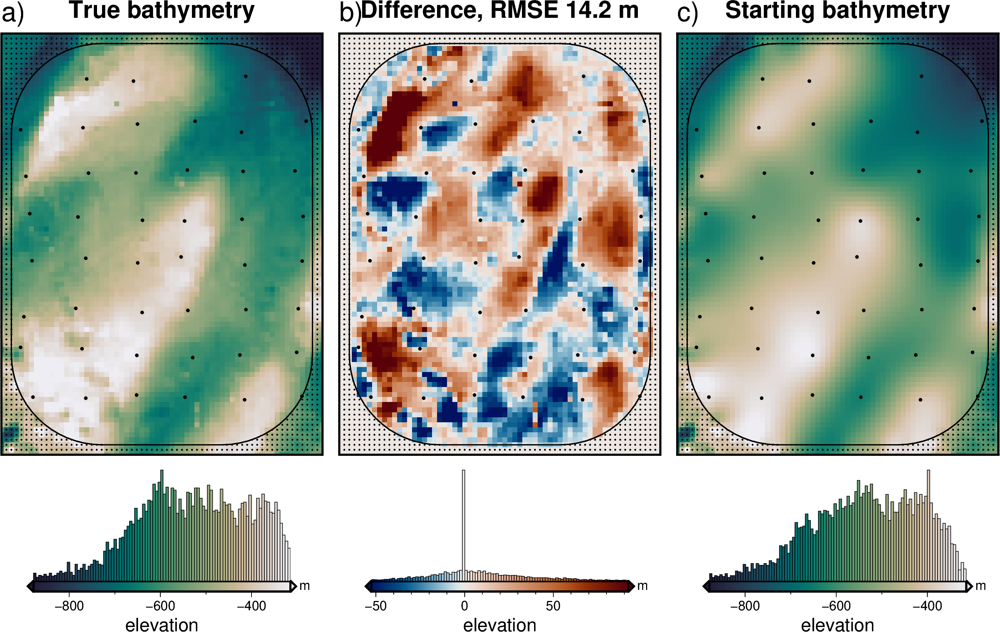

In [260]:
# compare starting and actual bed
bed_inner = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
lowres_bed_semiregular_inner = lowres_bed_semiregular.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

dif = bed_inner - lowres_bed_semiregular_inner
rms = utils.RMSE(dif)
robust=True
lims_a = utils.get_min_max(bed, robust=robust)
lims_b = utils.get_min_max(lowres_bed_semiregular, robust=robust)
lims = (min((lims_a[0], lims_b[0])), max(lims_a[1], lims_b[1]))

fig = maps.plot_grd(
    bed,
    fig_height=10,
    region = inversion_region,
    cbar_label = "elevation",
    cbar_unit = "m",
    title = "True bathymetry",
    cmap="rain",
    cpt_lims=lims,
    reverse_cpt=True,
    points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
    points_style="c.08c",
    inset=False,
    hist=True,
    title_font="16p,Helvetica-Bold",
    # robust=True,
)
fig.plot(
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.04c",
    fill="black",
)
fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="18p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    dif,
    region = inversion_region,
    cbar_label = "elevation",
    cbar_unit = "m",
    title = f"Difference, RMSE {round(rms,2)} m",
    cmap="vik+h0",
    points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
    points_style="c.08c",
    inset=False,
    hist=True,
    robust=True,
    title_font="16p,Helvetica-Bold",
    fig=fig,
    origin_shift="xshift",
)
fig.plot(
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.04c",
    fill="black",
)
fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="18p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    lowres_bed_semiregular,
    region = inversion_region,
    cbar_label = "elevation",
    cbar_unit = "m",
    title = "Starting bathymetry",
    cmap="rain",
    cpt_lims=lims,
    reverse_cpt=True,
    points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
    points_style="c.08c",
    inset=False,
    hist=True,
    # robust=True,
    title_font="16p,Helvetica-Bold",
    fig=fig,
    origin_shift="xshift",
)
fig.plot(
    x=constraints[constraints.inside==False].easting,
    y=constraints[constraints.inside==False].northing,
    style="c.04c",
    fill="black",
)
fig.plot(
    "../data/Ross_Sea_outline.shp",
    pen = "0.8p,black",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="18p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig.show()

In [261]:
rms

14.20201193948958

In [ ]:
np.sqrt(np.nanmedian(data**2).item())